In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import sctk as sk
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/SGN_analysis/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [3]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


In [4]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata_v2.csv',index_col=0)
meta

,sample_id,sample_id2,donor,gw,gender,10xKit,sequencing,dataset
sample,,,,,,,,
9.5gw,gw9,gw9,not_provided_1,9,female,SC3,snRNA-seq,public
11.2gw,gw11,gw11,not_provided_2,11,male,SC3,snRNA-seq,public
14+3gw,gw14,gw14,F20240701,14,male,SC3,snRNA-seq,in-house
15gw,gw15,gw15,not_provided_3,15,female,SC3,scRNA-seq,public
16+4gw,gw16,gw16,F20241018,16,male,SC3,snRNA-seq,in-house
17+2gw,gw17_1,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house
17+3gw,gw17_2,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house
17gw,gw17_3,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public
18+3gw,gw18,gw18,F20220806,18,male,SC3,snRNA-seq,in-house


In [5]:
adata_gw9=sc.read("human_gw9_5_raw.h5ad")
adata_gw9
adata_gw9.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 4284 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
CCs                      650
Chondrocytes             634
Mesenchymal              604
SGNs                     550
CoE_Lateral              508
GCs                      333
Vestibular_SCs           227
Vestibular_Roof_cells    223
Endothelial              170
CoE_Medial               122
CoE_prosensory           121
Macrophages               57
VGNs                      31
Vestibular_HCs            30
Melanocytes               24
Name: count, dtype: int64

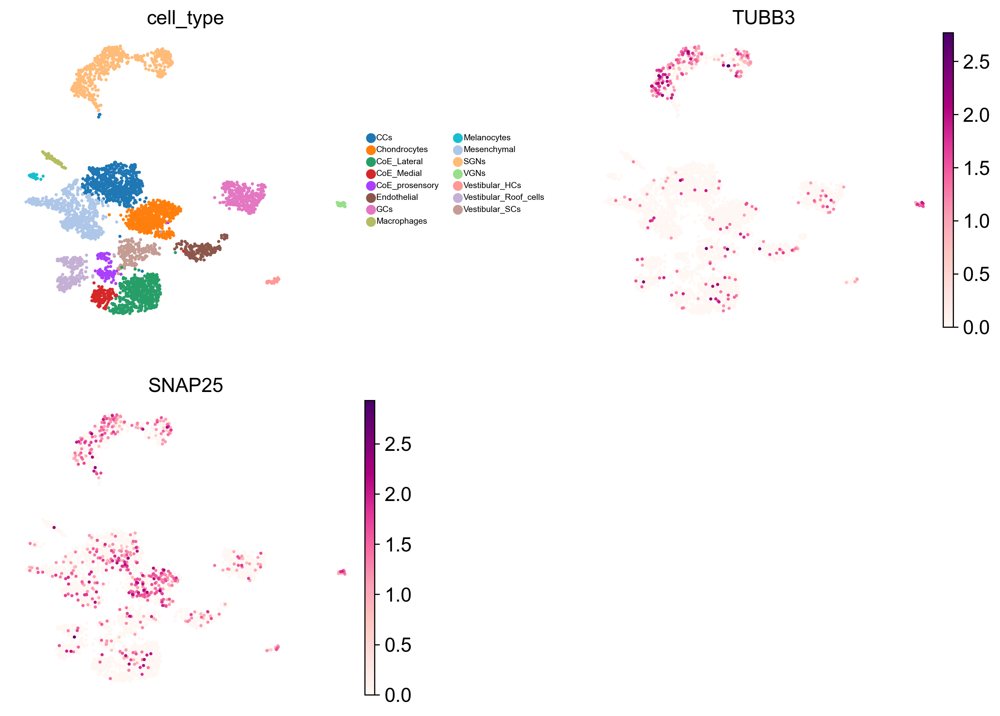

In [6]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_gw9, color=['cell_type', 'TUBB3','SNAP25'
                                
                            ],
           size=20,
           legend_fontsize=6,ncols = 2,wspace = 0.5, )

In [7]:
adata_gw9_sgn=adata_gw9[adata_gw9.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw9_sgn

View of AnnData object with n_obs × n_vars = 550 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [8]:
adata_gw11=sc.read("human_gw11_2_raw.h5ad")
adata_gw11
adata_gw11.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 4051 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal                    682
Vestibular_Epithelial_cells    551
CoE_Medial                     412
CCs                            409
Vestibular_SCs                 321
SGNs                           315
GCs                            295
CoE_Lateral                    286
CoE_Roof_cells                 220
Vestibular_Dark_cells          163
CoE_prosensory                 135
Vestibular_Roof_cells           72
Macrophages                     55
Chondrocytes                    52
Endothelial                     47
Vestibular_HCs                  27
Melanocytes                      9
Name: count, dtype: int64

In [9]:
adata_gw11_sgn=adata_gw11[adata_gw11.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw11_sgn

View of AnnData object with n_obs × n_vars = 315 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [10]:
adata_gw14=sc.read("human_gw14_raw.h5ad")
adata_gw14
adata_gw14.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 12081 × 38606
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal       7922
CoE_Medial        1227
CoE_Lateral        947
CoE_Roof_cells     375
CCs                343
Chondrocytes       318
Macrophages        253
Endothelial        208
GCs                196
Melanocytes         97
HCs                 87
CoE_prosensory      60
SGNs                48
Name: count, dtype: int64

In [11]:
adata_gw14_sgn=adata_gw14[adata_gw14.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw14_sgn

View of AnnData object with n_obs × n_vars = 48 × 38606
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [12]:
adata_gw16=sc.read("human_gw16_4_raw.h5ad")
adata_gw16
adata_gw16.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 8708 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal                             5045
SS                                       488
GCs                                      396
Claudius/Inner-Outer_sulcus_cells        360
Inner_border-phalangeal/Hensen_cells     334
Chondrocytes                             317
Endothelial                              249
Interdental_cells                        244
Marginal_stria                           214
CCs                                      206
Macrophages                              183
Tympanic_border_cells                    178
Reissner_membrane                         83
Intermediate_stria                        73
Basal_stria                               62
Spindle/Root_cells                        59
SGNs                                      55
Smooth_Muscle_Cells                       49
Deiters_cells                             35
HCs                                       33
pericytes                                 33
Pillar_cells                              12


In [13]:
adata_gw16_sgn=adata_gw16[adata_gw16.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw16_sgn

View of AnnData object with n_obs × n_vars = 55 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [14]:
adata_gw17_2=sc.read("human_gw17_2_333_raw.h5ad")
adata_gw17_2
adata_gw17_2.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 6773 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal                             3910
GCs                                     1265
Tympanic_border_cells                    535
Endothelial                              259
SS                                       145
CCs                                      134
pre-Osteocytes                            93
Smooth_Muscle_Cells                       82
Macrophages                               64
SGNs                                      54
Claudius/Inner-Outer_sulcus_cells         46
Inner_border-phalangeal/Hensen_cells      44
Deiters_cells/Pillar_cells                40
pericytes                                 36
Erythrocytes                              28
Interdental_cells                         26
Intermediate_stria                        12
Name: count, dtype: int64

In [15]:
adata_gw17_2_sgn=adata_gw17_2[adata_gw17_2.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw17_2_sgn

View of AnnData object with n_obs × n_vars = 54 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [16]:
adata_gw17_3=sc.read("human_gw17_3_310_raw.h5ad")
adata_gw17_3
adata_gw17_3.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 7148 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal                             3206
GCs                                      656
Fibrocytes                               542
Osteocytes/Osteoblasts                   358
SS                                       328
SGNs                                     282
Chondrocytes                             266
CCs                                      261
Endothelial                              239
Intermediate_stria                       221
Tympanic_border_cells                    211
Interdental_cells                        155
Macrophages                               66
Reissner_membrane                         56
Inner_border-phalangeal/Hensen_cells      55
Claudius/Inner-Outer_sulcus_cells         48
Pillar_cells                              41
Smooth_Muscle_Cells                       35
Deiters_cells                             34
Basal_stria                               31
Erythrocytes                              28
pericytes                                 20


In [17]:
adata_gw17_3_sgn=adata_gw17_3[adata_gw17_3.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw17_3_sgn

View of AnnData object with n_obs × n_vars = 282 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [18]:
adata_gw18=sc.read("human_gw18_3_336_raw.h5ad")
adata_gw18
adata_gw18.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 9595 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Mesenchymal                             4533
GCs                                     1239
Tympanic_border_cells                   1188
pre-Osteoblasts                          641
Endothelial                              480
SS                                       317
Intermediate_stria                       198
CCs                                      181
Reissner_membrane                        154
SGNs                                     139
Erythrocytes                             116
Claudius/Inner-Outer_sulcus_cells         82
Interdental_cells                         80
Macrophages                               58
Deiters_cells                             57
pericytes                                 51
Pillar_cells                              50
Smooth_Muscle_Cells                       17
Inner_border-phalangeal/Hensen_cells      14
Name: count, dtype: int64

In [19]:
adata_gw18_sgn=adata_gw18[adata_gw18.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw18_sgn

View of AnnData object with n_obs × n_vars = 139 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [20]:
adata_gw20=sc.read("human_gw20_305_raw.h5ad")
adata_gw20
adata_gw20.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 3833 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Tympanic_border_cells                   920
Osteocytes                              607
Intermediate_stria                      413
Chondrocytes                            269
Fibrocytes                              240
Macrophages                             194
Endothelial                             177
SS                                      142
Erythrocytes                            138
Interdental_cells                       113
CCs                                      79
Inner_border-phalangeal/Hensen_cells     66
Smooth_Muscle_Cells                      64
SGNs                                     63
Deiters_cells                            61
GCs                                      53
Osteoblasts                              50
Claudius/Inner-Outer_sulcus_cells        46
Pillar_cells                             36
Marginal_stria                           35
pericytes                                25
Spindle/Root_cells                       21
Basal_stria           

In [21]:
adata_gw20_sgn=adata_gw20[adata_gw20.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw20_sgn

View of AnnData object with n_obs × n_vars = 63 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [22]:
adata_gw22=sc.read("human_gw22_2_310_raw.h5ad")
adata_gw22
adata_gw22.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 5837 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Tympanic_border_cells                   1083
Mesenchymal                              883
Intermediate_stria                       671
GCs                                      573
Osteocytes/Osteoblasts                   453
Chondrocytes                             334
Endothelial                              317
Fibrocytes                               292
Claudius/Inner-Outer_sulcus_cells        215
Marginal_stria                           199
Erythrocytes                             174
Basal_stria                              128
Macrophages                              117
SS                                       106
CCs                                       92
Deiters_cells                             87
Pillar_cells                              44
Interdental_cells                         38
Inner_border-phalangeal/Hensen_cells      19
SGNs                                      12
Name: count, dtype: int64

In [23]:
adata_gw22_sgn=adata_gw22[adata_gw22.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw22_sgn

View of AnnData object with n_obs × n_vars = 12 × 38606
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [24]:
adata_gw23=sc.read("human_gw23_raw.h5ad")
adata_gw23
adata_gw23.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 3597 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Tympanic_border_cells                   411
Intermediate_stria                      365
pre-Osteoblasts                         299
Chondrocytes                            269
Osteoblasts                             257
Endothelial                             217
Reissner_membrane                       213
Claudius/Inner-Outer_sulcus_cells       203
Inner_border-phalangeal/Hensen_cells    159
Marginal_stria                          145
Fibrocytes                              143
Macrophages                             138
Pillar_cells                            119
Basal_stria                             113
CCs                                     110
Interdental_cells                        92
Osteocytes                               81
Deiters_cells                            80
pericytes                                49
GCs                                      46
HCs                                      31
Smooth_Muscle_Cells                      23
Spindle/Root_cells    

In [25]:
adata_gw23_sgn=adata_gw23[adata_gw23.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw23_sgn

View of AnnData object with n_obs × n_vars = 16 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [26]:
adata_gw25=sc.read("human_gw25_raw.h5ad")
adata_gw25
adata_gw25.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 13936 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Endothelial                             2556
Tympanic_border_cells                   2122
Fibrocytes                              1900
GCs                                     1812
Osteocytes                              1622
Intermediate_stria                      1213
Osteoblasts                              587
SGNs                                     487
Claudius/Inner-Outer_sulcus_cells        370
Deiters_cells                            294
Macrophages                              193
SS                                       150
CCs                                      129
Pillar_cells                             124
Smooth_Muscle_Cells                      108
pericytes                                 91
Marginal_stria                            75
Interdental_cells                         62
Inner_border-phalangeal/Hensen_cells      27
HCs                                        9
Basal_stria                                5
Name: count, dtype: int64

In [27]:
adata_gw25_sgn=adata_gw25[adata_gw25.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw25_sgn

View of AnnData object with n_obs × n_vars = 487 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [28]:
adata_gw26=sc.read("human_gw26_raw.h5ad")
adata_gw26
adata_gw26.obs['cell_type'].value_counts()

AnnData object with n_obs × n_vars = 7872 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

cell_type
Endothelial              2842
GCs                      1483
Osteocytes                778
Tympanic_border_cells     690
Intermediate_stria        527
SS                        333
Osteoblasts               289
Fibrocytes                202
pre-Osteoblasts           175
CCs                       168
Macrophages               161
Erythrocytes               86
SGNs                       59
Smooth_Muscle_Cells        38
SCs                        21
pericytes                  10
Basal_stria                 6
Reissner_membrane           4
Name: count, dtype: int64

In [29]:
adata_gw26_sgn=adata_gw26[adata_gw26.obs['cell_type'].isin(['SGNs',]
    
)]
adata_gw26_sgn

View of AnnData object with n_obs × n_vars = 59 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_R', 'leiden_R_colors', 'leiden_colors', 'log1p', 'louvain', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [30]:
# merge early sgns with 9gw and 11gw that express NEUROD1。
import anndata
adata_early_sgn = anndata.concat([adata_gw11_sgn,adata_gw9_sgn])
adata_early_sgn

AnnData object with n_obs × n_vars = 865 × 36601
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    obsm: 'X_pca', 'X_umap'

In [40]:
# merge gradual specificational sgn within 12 to 18gw
import anndata
adata_gradual_sgn = anndata.concat([adata_gw18_sgn,adata_gw17_3_sgn,adata_gw17_2_sgn, adata_gw16_sgn,adata_gw14_sgn])
adata_gradual_sgn

AnnData object with n_obs × n_vars = 578 × 23412
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    obsm: 'X_pca', 'X_umap'

In [41]:
# merge consolidating sgns that specify typeI/II subtype.
adata_final_sgn = anndata.concat([adata_gw26_sgn, adata_gw25_sgn,adata_gw23_sgn,adata_gw22_sgn,adata_gw20_sgn])
adata_final_sgn

AnnData object with n_obs × n_vars = 637 × 23412
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type'
    obsm: 'X_pca', 'X_umap'

In [42]:
import anndata
adata_all_sgn = anndata.concat([adata_gw26_sgn, adata_gw25_sgn,adata_gw23_sgn,adata_gw22_sgn,adata_gw20_sgn,adata_gw18_sgn,
                      adata_gw17_3_sgn,adata_gw17_2_sgn, adata_gw16_sgn,adata_gw14_sgn,adata_gw11_sgn,adata_gw9_sgn])
adata_all_sgn

AnnData object with n_obs × n_vars = 2080 × 23412
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type'
    obsm: 'X_pca', 'X_umap'

In [43]:
import scanpy as sc
import scrublet as scr
import numpy as np
import matplotlib.pyplot as plt

In [44]:
# 基本预处理
sc.pp.filter_genes(adata_early_sgn, min_cells=1)  # 过滤掉在少于3个细胞中表达的基因
sc.pp.normalize_total(adata_early_sgn, target_sum=1e4)  # 归一化
sc.pp.log1p(adata_early_sgn)  # 对数转换
sc.pp.filter_genes(adata_gradual_sgn, min_cells=1)  # 过滤掉在少于3个细胞中表达的基因
sc.pp.normalize_total(adata_gradual_sgn, target_sum=1e4)  # 归一化
sc.pp.log1p(adata_gradual_sgn)  # 对数转换
sc.pp.filter_genes(adata_final_sgn, min_cells=1)  # 过滤掉在少于3个细胞中表达的基因
sc.pp.normalize_total(adata_final_sgn, target_sum=1e4)  # 归一化
sc.pp.log1p(adata_final_sgn)  # 对数转换

In [45]:
# 初始化Scrublet对象
scrub_early_sgn = scr.Scrublet(adata_early_sgn.X)

# 检测双细胞
doublet_scores, predicted_doublets = scrub_early_sgn.scrub_doublets()

# 将结果添加到adata对象中
adata_early_sgn.obs['doublet_score'] = doublet_scores
adata_early_sgn.obs['predicted_doublet'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.50
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 25.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.5%
Elapsed time: 0.7 seconds


In [46]:
# 初始化Scrublet对象
scrub_gradual_sgn = scr.Scrublet(adata_gradual_sgn.X)

# 检测双细胞
doublet_scores, predicted_doublets = scrub_gradual_sgn.scrub_doublets()

# 将结果添加到adata对象中
adata_gradual_sgn.obs['doublet_score'] = doublet_scores
adata_gradual_sgn.obs['predicted_doublet'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 36.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.4%
Elapsed time: 0.5 seconds


In [47]:
# 初始化Scrublet对象
scrub_final_sgn = scr.Scrublet(adata_final_sgn.X)

# 检测双细胞
doublet_scores, predicted_doublets = scrub_final_sgn.scrub_doublets()

# 将结果添加到adata对象中
adata_final_sgn.obs['doublet_score'] = doublet_scores
adata_final_sgn.obs['predicted_doublet'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.48
Detected doublet rate = 2.5%
Estimated detectable doublet fraction = 4.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 52.5%
Elapsed time: 0.5 seconds


(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

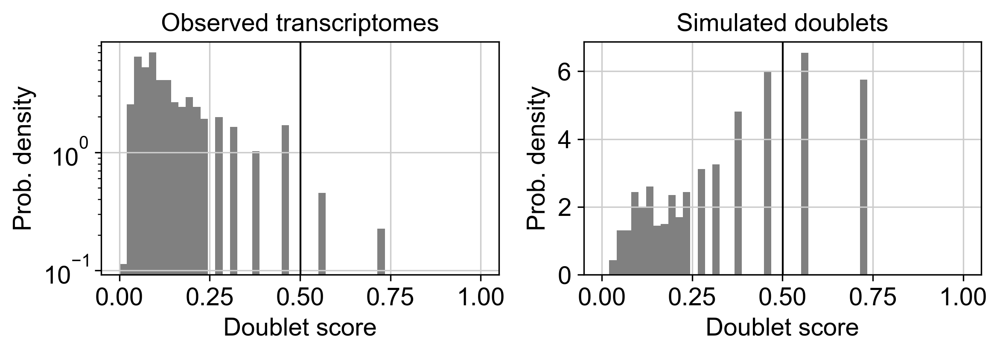

(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

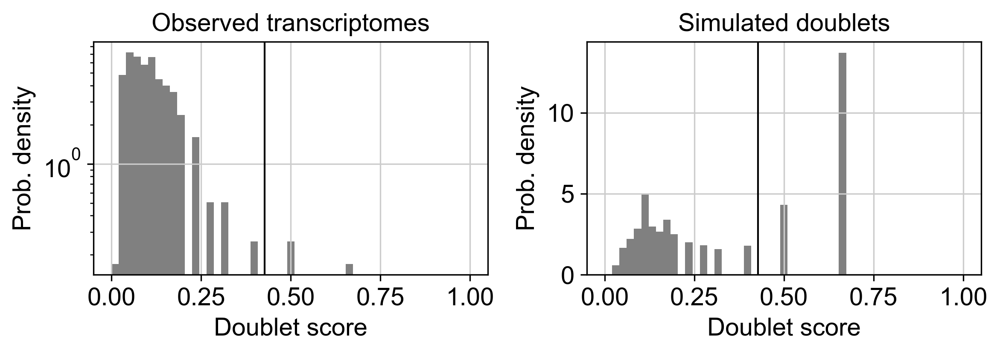

(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

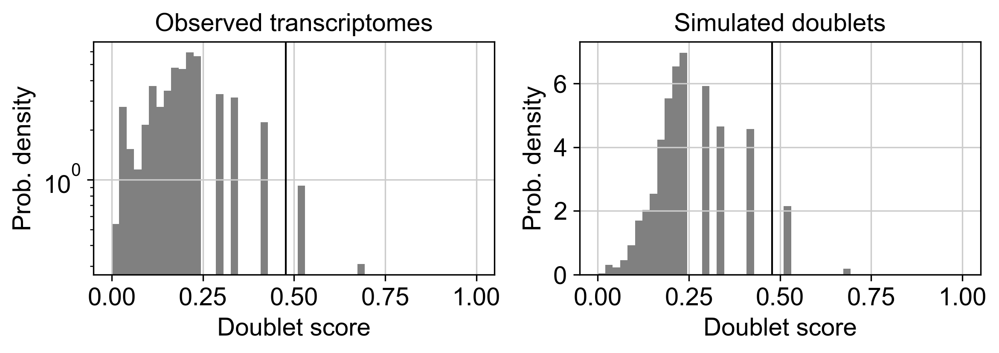

In [50]:
# 绘制双细胞得分直方图
scrub_early_sgn.plot_histogram()

# 显示图形
plt.show()
# 绘制双细胞得分直方图
scrub_gradual_sgn.plot_histogram()

# 显示图形
plt.show()
scrub_final_sgn.plot_histogram()

# 显示图形
plt.show()

In [51]:
adata_early_sgn

AnnData object with n_obs × n_vars = 865 × 24704
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [52]:
# 过滤双细胞
adata_early_sgn = adata_early_sgn[~adata_early_sgn.obs['predicted_doublet'], :]

# 查看过滤后的数据
adata_early_sgn

View of AnnData object with n_obs × n_vars = 853 × 24704
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [53]:
adata_gradual_sgn

AnnData object with n_obs × n_vars = 578 × 17680
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [54]:
# 过滤双细胞
adata_gradual_sgn = adata_gradual_sgn[~adata_gradual_sgn.obs['predicted_doublet'], :]

# 查看过滤后的数据
adata_gradual_sgn

View of AnnData object with n_obs × n_vars = 573 × 17680
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [55]:
adata_final_sgn

AnnData object with n_obs × n_vars = 637 × 17746
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [56]:
# 过滤双细胞
adata_final_sgn = adata_final_sgn[~adata_final_sgn.obs['predicted_doublet'], :]

# 查看过滤后的数据
adata_final_sgn

View of AnnData object with n_obs × n_vars = 621 × 17746
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

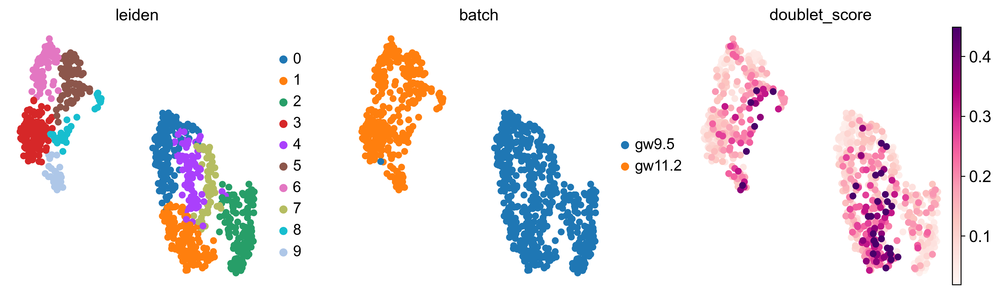

In [57]:
# 进一步分析
sc.pp.highly_variable_genes(adata_early_sgn, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.tl.pca(adata_early_sgn, svd_solver='arpack')
sc.pp.neighbors(adata_early_sgn)
sc.tl.umap(adata_early_sgn)
sc.tl.leiden(adata_early_sgn)

# 可视化UMAP
sc.pl.umap(adata_early_sgn, color=['leiden','batch','doublet_score'])

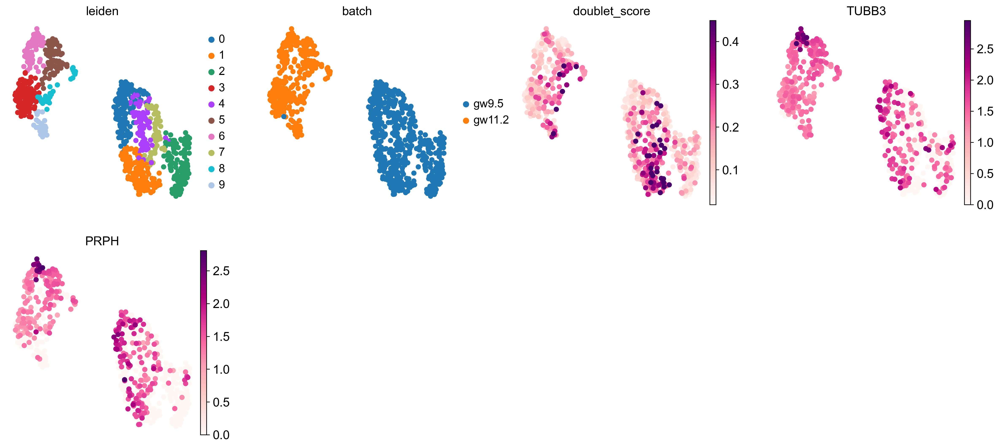

In [58]:
sc.pl.umap(adata_early_sgn, color=['leiden','batch','doublet_score','TUBB3','PRPH'])

In [112]:
# 保存整合后的数据
adata_early_sgn.write('adata_early_sgn.h5ad')
adata_gradual_sgn.write('adata_gradual_sgn.h5ad')
adata_final_sgn.write('adata_final_sgn.h5ad')

提取后的细胞数量: 546


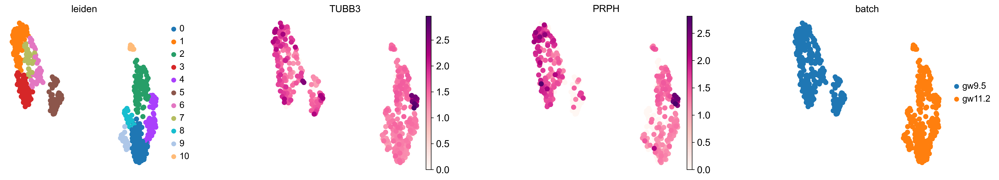

In [59]:
# for early sgn
import scanpy as sc
import numpy as np
from scipy.sparse import issparse

# 检查基因是否存在
if 'TUBB3' not in adata_early_sgn.var_names:
    print("TUBB3 基因不存在于数据集中！")
if 'PRPH' not in adata_early_sgn.var_names:
    print("PRPH 基因不存在于数据集中！")

# 提取 TUBB3 或 PRPH 阳性的细胞
tubb3_positive_cells = adata_early_sgn[:, 'TUBB3'].X.toarray().flatten() > 0
prph_positive_cells = adata_early_sgn[:, 'PRPH'].X.toarray().flatten() > 0
positive_cells = tubb3_positive_cells | prph_positive_cells

# 过滤出阳性细胞
adata_positive_early_sgn = adata_early_sgn[positive_cells, :]

# 查看提取后的数据
print(f"提取后的细胞数量: {adata_positive_early_sgn.n_obs}")

# 标准化和对数转换
sc.pp.normalize_total(adata_positive_early_sgn, target_sum=1e4)
sc.pp.log1p(adata_positive_early_sgn)

# 检查并处理 NaN 值
if issparse(adata_positive_early_sgn.X):
    if np.isnan(adata_positive_early_sgn.X.toarray()).any():
        print("数据中存在 NaN 值，已替换为 0。")
        adata_positive_early_sgn.X = np.nan_to_num(adata_positive_early_sgn.X.toarray())
else:
    if np.isnan(adata_positive_early_sgn.X).any():
        print("数据中存在 NaN 值，已替换为 0。")
        adata_positive_early_sgn.X = np.nan_to_num(adata_positive_early_sgn.X)

# 过滤掉在所有细胞中表达量为零的基因
sc.pp.filter_genes(adata_positive_early_sgn, min_cells=1)

# 选择高变基因
sc.pp.highly_variable_genes(adata_positive_early_sgn, min_mean=0.0125, max_mean=3, min_disp=0.5)

# 缩放数据
#sc.pp.scale(adata_positive, max_value=10)

# PCA降维
#sc.tl.pca(adata_positive, svd_solver='arpack')

# 聚类和可视化
sc.pp.neighbors(adata_positive_early_sgn, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_positive_early_sgn)
sc.tl.leiden(adata_positive_early_sgn)
sc.pl.umap(adata_positive_early_sgn, color=['leiden', 'TUBB3', 'PRPH','batch'], wspace=0.5)


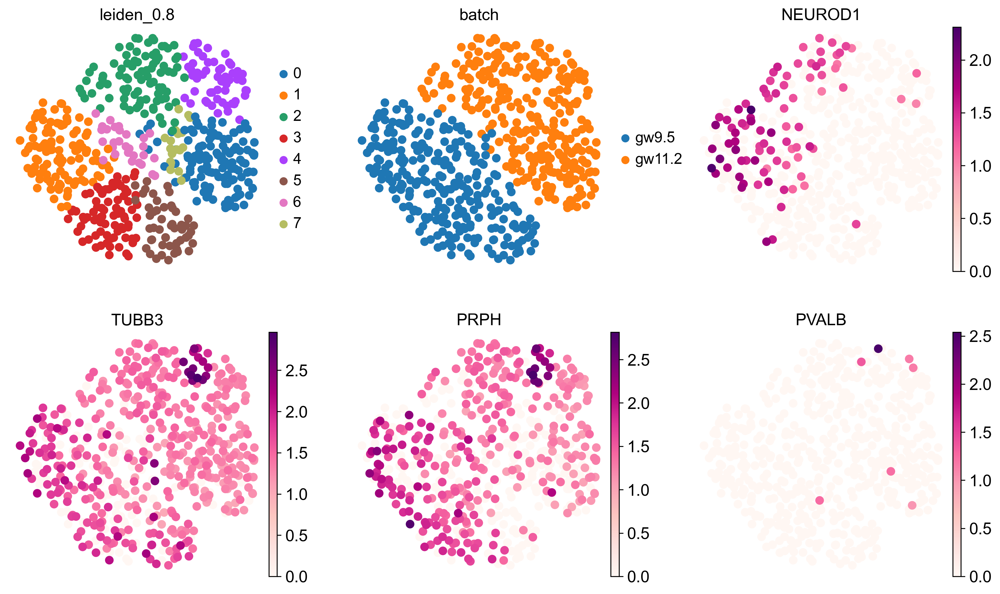

In [60]:
# 聚类和可视化
sc.pp.neighbors(adata_positive_early_sgn, n_neighbors=90, n_pcs=50)
sc.tl.umap(adata_positive_early_sgn,min_dist=1.6)
sc.tl.leiden(adata_positive_early_sgn,key_added="leiden_0.8")
sc.pl.umap(adata_positive_early_sgn, color=['leiden_0.8','batch','NEUROD1','TUBB3','PRPH','PVALB'],ncols=3,)

In [61]:
adata_positive_early_sgn.obs['batch'].value_counts()

batch
gw11.2    283
gw9.5     263
Name: count, dtype: int64

In [224]:
# remove gw23 cell
#exclude_clusters = ['gw23']
#adata_positive_2= adata_positive[~adata_positive.obs['batch'].isin(exclude_clusters), :]

In [62]:
import harmonypy as hm

2025-03-15 15:39:24,663 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-15 15:39:24,933 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-15 15:39:24,963 - harmonypy - INFO - Iteration 1 of 10
2025-03-15 15:39:25,035 - harmonypy - INFO - Iteration 2 of 10
2025-03-15 15:39:25,077 - harmonypy - INFO - Converged after 2 iterations


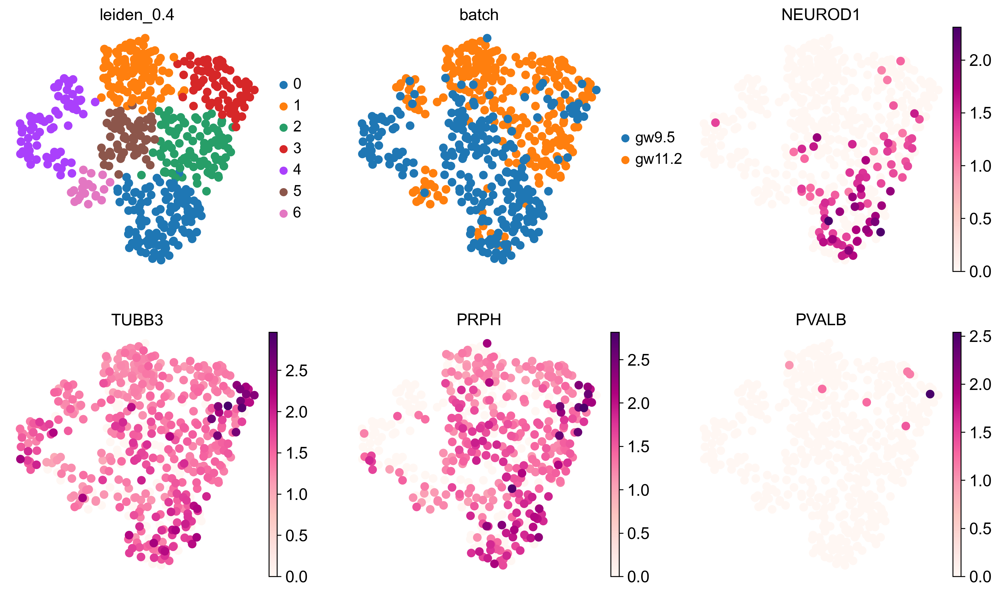

In [63]:
# 选择高变基因
adata_positive_early_sgn_hm=adata_positive_early_sgn.copy()
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata = adata[:, adata.var.highly_variable]

# 缩放数据
#sc.pp.scale(adata, max_value=10)

# PCA降维
#sc.tl.pca(adata, svd_solver='arpack')

# 提取 PCA 嵌入和批次信息
pca_embedding = adata_positive_early_sgn_hm.obsm['X_pca']
batch_labels = adata_positive_early_sgn_hm.obs['batch'].values

# 运行 Harmony
ho = hm.run_harmony(pca_embedding, adata_positive_early_sgn_hm.obs, vars_use=['batch'], max_iter_harmony=10)

# 将整合后的嵌入保存到 adata 对象中
adata_positive_early_sgn_hm.obsm['X_harmony'] = ho.Z_corr.T

# 使用整合后的嵌入进行 UMAP 降维
sc.pp.neighbors(adata_positive_early_sgn_hm, use_rep='X_harmony',n_neighbors=10)
sc.tl.leiden(adata_positive_early_sgn_hm,resolution=0.4,key_added="leiden_0.4")
sc.tl.umap(adata_positive_early_sgn_hm,min_dist=0.8)

# 可视化整合前后的 UMAP
sc.pl.umap(adata_positive_early_sgn_hm, color=['leiden_0.4','batch','NEUROD1','TUBB3','PRPH','PVALB'],ncols=3,)

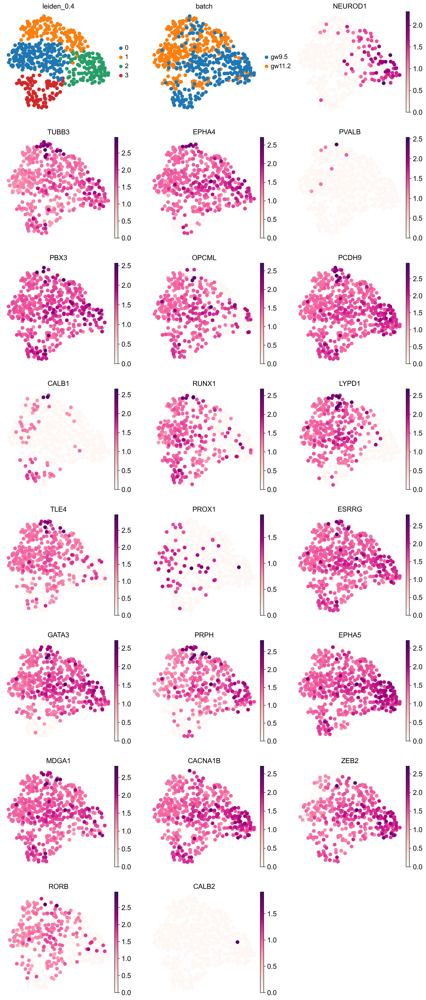

In [105]:
# 使用整合后的嵌入进行 UMAP 降维
sc.pp.neighbors(adata_positive_early_sgn_hm, use_rep='X_harmony',n_neighbors=25)
sc.tl.leiden(adata_positive_early_sgn_hm,resolution=0.4,key_added="leiden_0.4")
sc.tl.umap(adata_positive_early_sgn_hm,min_dist=1.2)

# 可视化整合前后的 UMAP
sc.pl.umap(adata_positive_early_sgn_hm, color=['leiden_0.4','batch','NEUROD1','TUBB3','EPHA4','PVALB',
                        'PBX3','OPCML','PCDH9','CALB1','RUNX1','LYPD1','TLE4','PROX1','ESRRG',
                        'GATA3','PRPH','EPHA5','MDGA1','CACNA1B','ZEB2','RORB','CALB2'],ncols=3,)

In [106]:
# 保存整合后的数据
adata_positive_early_sgn_hm.write('human_sgn_harmony_integration_early_sgn.h5ad')

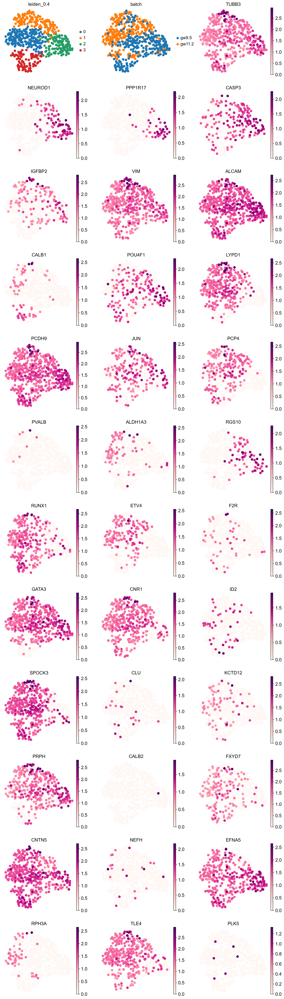

In [107]:
# 可视化整合前后的 UMAP
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_positive_early_sgn_hm, color=['leiden_0.4','batch','TUBB3',
                                               "NEUROD1","PPP1R17","CASP3",#Early SGN
  "IGFBP2","VIM","ALCAM","CALB1",'POU4F1',#Intermediate SGN
  "LYPD1","PCDH9","JUN","PCP4",#IB/C precursor
  "PVALB","ALDH1A3","RGS10",'RUNX1',#Immature IB/C
  "ETV4","F2R","GATA3","CNR1","ID2",#IA/2 precursor
  "SPOCK3","CLU","KCTD12","PRPH",#IA precursor
  "CALB2","FXYD7","CNTN5","NEFH",#Immature IA
  "EFNA5","RPH3A","TLE4",'PLK5' # Immature Type2
  
                                             ],ncols=3,)

In [79]:
%run _markers_v2.py

##### rename leiden_0.3 cluster, rename formula is highest_marker_genes+cell_type

In [108]:
mkst = calc_marker_stats(adata_positive_early_sgn_hm, 'leiden_0.4',use_rep=False,)

meta NOT subset; don't know how to subset; dropped


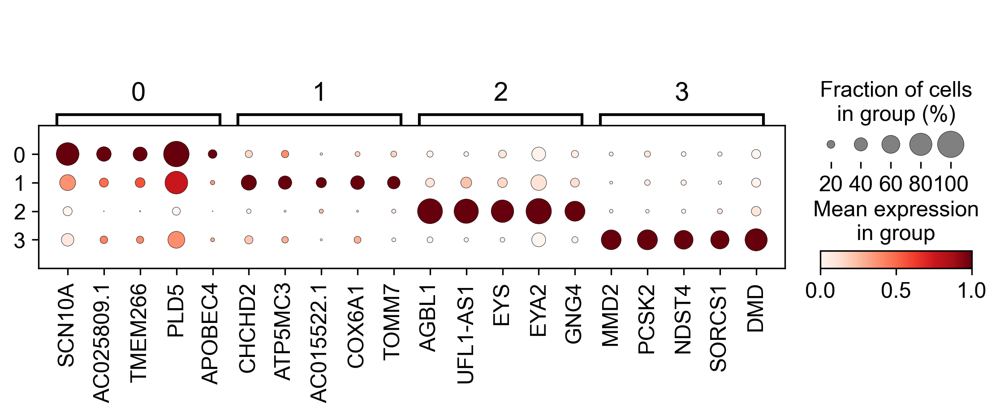

In [109]:
mks = filter_marker_stats(mkst, max_next_frac=0.2, min_mean_diff=0.3, how='or')
plot_markers(adata_positive_early_sgn_hm, 'leiden_0.3', mks, standard_scale='var', save='dotplot_leiden_0.3_early_sgn.pdf')

In [110]:
pd.DataFrame(mks).to_csv('human_early_sgn_markers.csv')